# CANOPY-SOIL REFLECTANCE SPECTRA GENERATION USING NEURAL NETWORKS

In [ ]:
pip install torchmetrics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 7.1 MB/s eta 0:00:00


In [ ]:
pip install pytorch-lightning -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 802.2/802.2 kB 7.3 MB/s eta 0:00:00


In [ ]:
import pytorch_lightning as pl
import torch
import pandas as pd
import numpy as np
from torch import nn, optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from torch.utils.data import Dataset, DataLoader
from pytorch_lightning.tuner.tuning import Tuner
import matplotlib.pyplot as plt
import glob
from scipy.ndimage import gaussian_filter1d
from torchmetrics import MeanSquaredError
from functools import reduce

In [ ]:
#mount Drive as external disk
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


%cd '/content/drive/MyDrive/Colab/Imaging'

ModuleNotFoundError: No module named 'google'

## Loading and splitting of the datesets

In [ ]:
parameters = pd.read_csv('./dati/parameters.csv')
reflectance = pd.read_csv('./dati/reflectance.csv')
fluorescence = pd.read_csv('./dati/fluorescence.csv')

In [ ]:
# split train validation and test dataframe
train_parameters, test_parameters, train_reflectance, test_reflectance = train_test_split(parameters, reflectance, test_size = 0.3)
val_parameters, test_parameters, val_reflectance, test_reflectance = train_test_split(test_parameters, test_reflectance, test_size = 0.5)

In [ ]:
parameters

,Cab,LAI,Canopy_1,Canopy_2,Canopy_3
0,20,1.0,True,False,False
1,22,1.0,True,False,False
2,24,1.0,True,False,False
3,26,1.0,True,False,False
4,28,1.0,True,False,False
...,...,...,...,...,...
2878,72,7.0,False,False,True
2879,74,7.0,False,False,True
2880,76,7.0,False,False,True
2881,78,7.0,False,False,True


In [ ]:
# Array of the wavelenght
wl = np.arange(500.,850.)

## Training of the autoencoders

### Definition of the Dataset and Dataloader


In [ ]:
# Define the dataset
class Dataset_autoencoder(Dataset):
    def __init__(self, spectra):
        # Dataframe in pandas
        self.spectra = spectra


    def __len__(self):
        # here i will return the number of samples in the dataset
        return len(self.spectra)


    def __getitem__(self, idx):
        # take the spectra in position idx
        cur_spectra = self.spectra.iloc[idx]
        # convert to torch format
        cur_spectra = torch.tensor(cur_spectra).unsqueeze(0)

        # return values
        return cur_spectra.to(torch.float32)

In [ ]:
# Dataloader of pytorch lighting

class AutoencoderDataModule(pl.LightningDataModule):

  def __init__(self, train_data: pd.DataFrame, val_data: pd.DataFrame, test_data: pd.DataFrame, batch_size: int):
    super().__init__()
    self.train_data = train_data
    self.val_data = val_data
    self.test_data = test_data
    self.batch_size = batch_size

  def train_dataloader(self):
    return DataLoader(
        dataset=Dataset_autoencoder(self.train_data),
        batch_size = self.batch_size,
        shuffle = True
      )

  def val_dataloader(self):
    return DataLoader(
        dataset=Dataset_autoencoder(self.val_data),
        batch_size = self.batch_size,
        shuffle = False
      )

  def test_dataloader(self):
    return DataLoader(
        dataset=Dataset_autoencoder(self.test_data),
        batch_size = self.batch_size,
        shuffle = False
      )

### Training and Testing Fully Connected Autoencoder

In [ ]:
# Define the lightning Module

class FCAutoEncoder(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.lr = 1e-3
        self.encoder = nn.Sequential(
              nn.Linear(350, 400),
              nn.LeakyReLU(),
              nn.Dropout(0.6),
              nn.Linear(400, 10)
          )
        self.decoder = nn.Sequential(
              nn.Linear(10, 400),
              nn.LeakyReLU(),
              nn.Dropout(0.6),
              nn.Linear(400, 350)
          )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

    def training_step(self, batch, batch_idx):
        # training_step defines the train loop.
        # it is independent of forward
        x = batch
        x_hat = self.forward(x)
        loss = nn.functional.mse_loss(x_hat, x)
        # Logging to TensorBoard (if installed) by default
        self.log("train_loss", loss, prog_bar = True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.lr)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, 1000)
        return [optimizer], [scheduler]

    def validation_step(self, batch, batch_idx):
        # this is the validation loop
        # use mae?
        x = batch
        x_hat = self.forward(x)
        val_loss = nn.functional.mse_loss(x_hat, x)
        self.log("val_loss", val_loss, prog_bar = True)

    def test_step(self, batch, batch_idx):
        # Define the test loop
        x = batch
        x_hat = self.forward(x)
        test_loss = nn.functional.mse_loss(x_hat, x)
        self.log("test_loss", test_loss)

In [ ]:
# Defien Dataloader
data_autoencoder = AutoencoderDataModule(train_reflectance, val_reflectance, test_reflectance, batch_size = 250)

# init the model
autoencoder = FCAutoEncoder()
# train with both splits
trainer = pl.Trainer(
    max_epochs=300,
    default_root_dir = '/content/fc_autoencoder/',
    callbacks=[pl.callbacks.ModelCheckpoint(monitor='val_loss')]
)

trainer.fit(autoencoder, datamodule = data_autoencoder)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 144 K 
1 | decoder | Sequential | 144 K 
---------------------------------------
289 K     Trainable params
0         Non-trainable params
289 K     Total params
1.157     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=300` reached.


In [ ]:
# Take the best last model
folder = glob.glob('/content/fc_autoencoder/lightning_logs/version*')
folder.sort()
best_fc_autoencoder = glob.glob(folder[-1]+'/checkpoints/*')

In [ ]:
# test the model
trainer.test(ckpt_path= best_fc_autoencoder[-1], dataloaders=data_autoencoder)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/fc_autoencoder/lightning_logs/version_0/checkpoints/epoch=264-step=2385.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/fc_autoencoder/lightning_logs/version_0/checkpoints/epoch=264-step=2385.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │  2.9654322133865207e-05   │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 2.9654322133865207e-05}]

In [ ]:
# load checkpoint
fc_autoencoder = FCAutoEncoder.load_from_checkpoint(best_fc_autoencoder[0])

# choose your trained nn.Module
fc_autoencoder.eval()
device = torch.device("cuda:0")

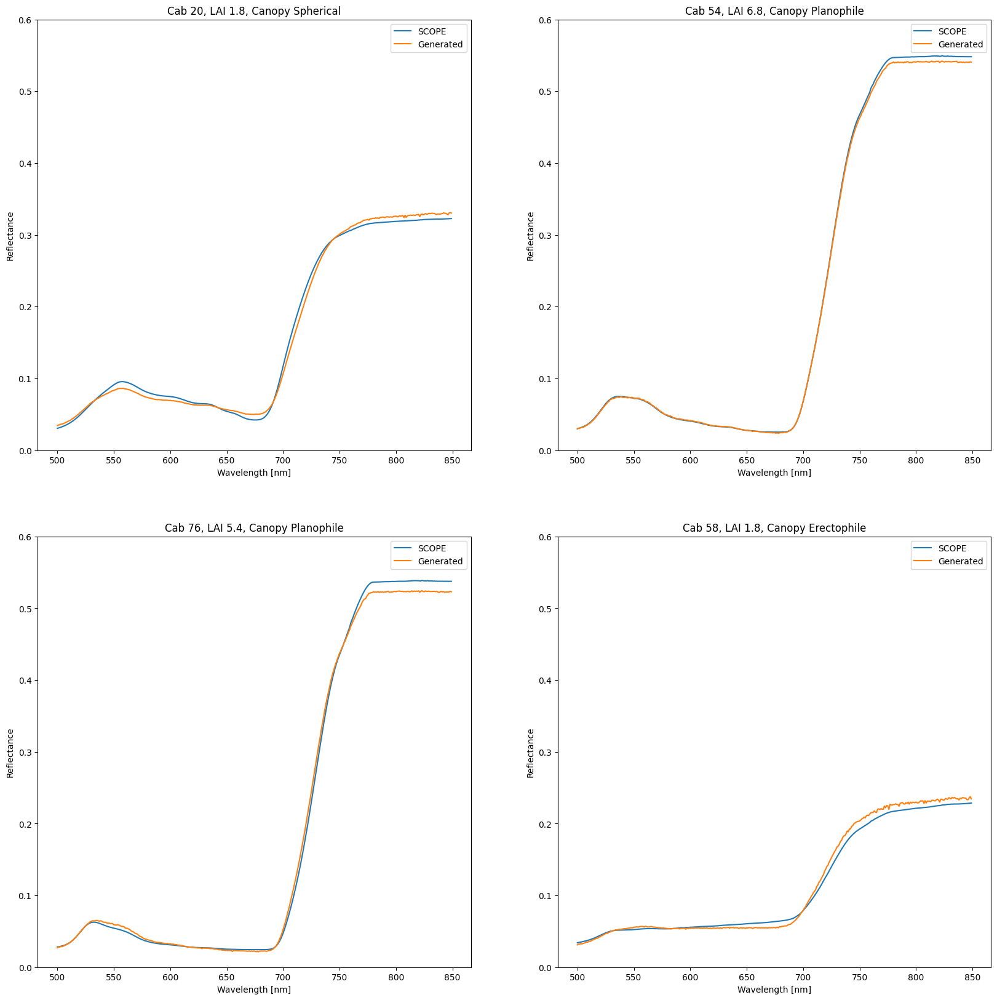

In [ ]:
indx = [-1, 3, 33, 67, 128, 85, 31, 53, 124, 286, 12, 186, 352, 226, 142]
i = 0
fig, axs = plt.subplots(2, 2, figsize = (20,20))

for ax in axs.flat:
  spectro = test_reflectance.iloc[indx[i]]
  predict_ref = fc_autoencoder(torch.tensor(spectro).to(torch.float32).unsqueeze(0).unsqueeze(0))
  par = test_parameters.iloc[indx[i]]
  canopy = par[par == True].index[0]
  #replace the name of the canopy
  for pair in (('Canopy_1', 'Spherical'), ('Canopy_2', 'Erectophile'), ('Canopy_3', 'Planophile')):
    canopy = canopy.replace(*pair)

  ax.plot(wl, spectro, label='SCOPE')
  ax.plot(wl, predict_ref.detach().numpy()[0,0], label = 'Generated')
  ax.set_title('Cab ' + str(par[0]) +', LAI ' + str(par[1]) + ', Canopy ' + canopy)
  ax.legend()
  ax.set_xlabel('Wavelength [nm]')
  ax.set_ylabel('Reflectance [%]')
  i += 1

# Defining custom 'ylim' values.
custom_ylim = (0, 0.6)
# Setting the values for all axes.
plt.setp(axs, ylim= custom_ylim);

### Training and Testing Convolutional Autoencoder

In [ ]:
 # Define the lightning Module

class ConvAutoEncoder(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.lr = 1e-3
                # Encoder
        self.encoder = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Flatten(),
            nn.Linear(64*44, 10)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(10, 64*44),
            nn.ReLU(True),
            nn.Unflatten(1, (64, 44)),
            nn.ConvTranspose1d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            nn.ConvTranspose1d(in_channels=32, out_channels=16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            nn.ConvTranspose1d(in_channels=16, out_channels=1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

    def training_step(self, batch, batch_idx):
        # training_step defines the train loop.
        # it is independent of forward

        x = batch
        x_hat = self.forward(x)[:,:,:350]
        loss = nn.functional.mse_loss(x_hat, x)
        # Smoothness penalty
        #lambda_smoothness = 0.1
        #smoothness_penalty = torch.mean(torch.abs(torch.diff(x_hat, n=2)))
        #loss += lambda_smoothness * smoothness_penalty
        # Logging to TensorBoard (if installed) by default
        self.log("train_loss", loss, prog_bar = True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.lr)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, 1000)
        return [optimizer], [scheduler]

    def validation_step(self, batch, batch_idx):
        # this is the validation loop
        # use mae?
        x = batch
        x_hat = self.forward(x)[:,:,:350]
        val_loss = nn.functional.mse_loss(x_hat, x)
        self.log("val_loss", val_loss, prog_bar = True)

    def test_step(self, batch, batch_idx):
        # Define the test loop
        x = batch
        x_hat = self.forward(x)[:,:,:350]
        test_loss = nn.functional.mse_loss(x_hat, x)
        self.log("test_loss", test_loss)


In [ ]:
# Defien Dataloader
data_autoencoder = AutoencoderDataModule(train_reflectance, val_reflectance, test_reflectance, batch_size = 250)

# init the model
autoencoder = ConvAutoEncoder()
# train with both splits
trainer = pl.Trainer(
    max_epochs=300,
    default_root_dir = '/content/conv_autoencoder/',
    callbacks=[pl.callbacks.ModelCheckpoint(monitor='val_loss')]
)


trainer.fit(autoencoder, datamodule = data_autoencoder)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 36.0 K
1 | decoder | Sequential | 38.8 K
---------------------------------------
74.8 K    Trainable params
0         Non-trainable params
74.8 K    Total params
0.299     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=300` reached.


In [ ]:
# Take the best last model
folder = glob.glob('/content/conv_autoencoder/lightning_logs/version*')
folder.sort()
best_conv_autoencoder = glob.glob(folder[-1]+'/checkpoints/*')

In [ ]:
# test the model
trainer.test(ckpt_path= best_conv_autoencoder[0], dataloaders=data_autoencoder)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/conv_autoencoder/lightning_logs/version_0/checkpoints/epoch=279-step=2520.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/conv_autoencoder/lightning_logs/version_0/checkpoints/epoch=279-step=2520.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │  2.6180341592407785e-06   │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 2.6180341592407785e-06}]

In [ ]:
# load checkpoint
conv_autoencoder = ConvAutoEncoder.load_from_checkpoint(best_conv_autoencoder[0])

# choose your trained nn.Module
conv_autoencoder.eval()
device = torch.device("cuda:0")

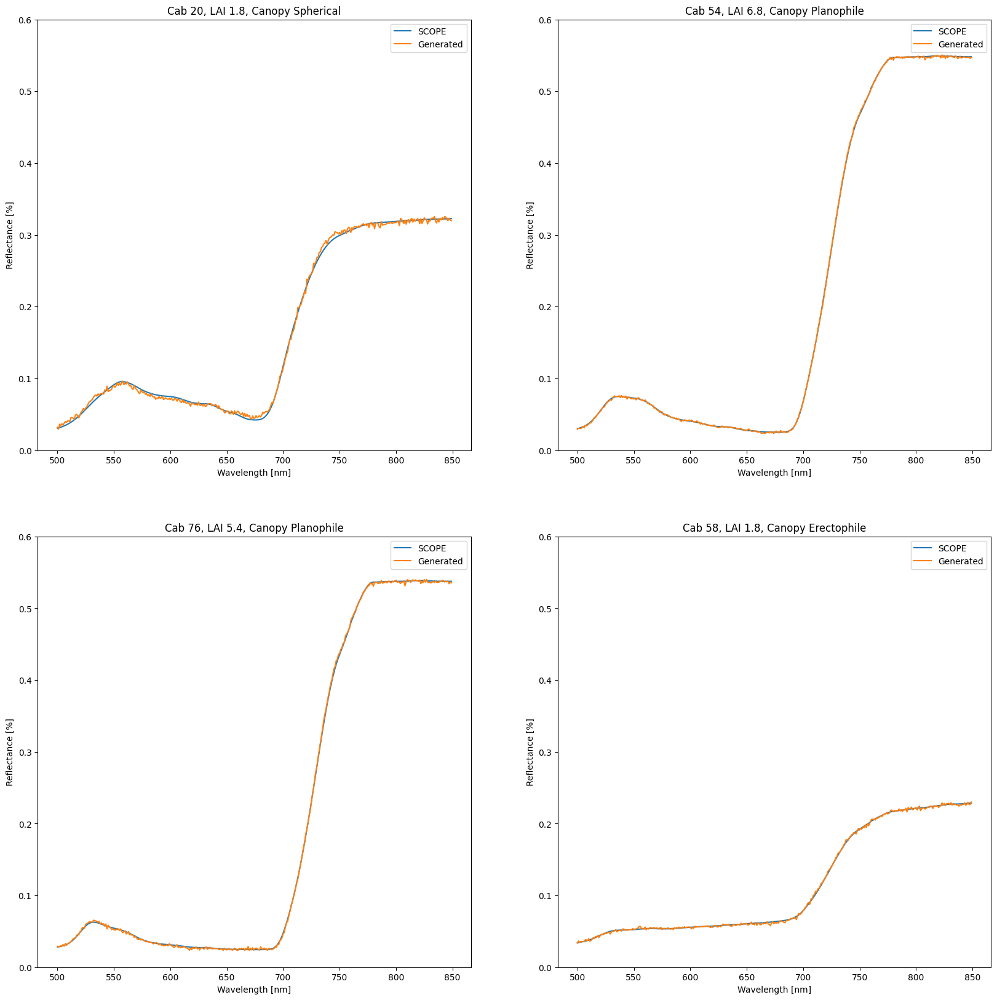

In [ ]:
indx = [-1, 3, 33, 67, 128, 85, 31, 53, 124, 286, 12, 186, 352, 226, 142]
i = 0
fig, axs = plt.subplots(2, 2, figsize = (20,20))

for ax in axs.flat:
  spectro = test_reflectance.iloc[indx[i]]
  predict_ref = conv_autoencoder(torch.tensor(spectro).to(torch.float32).unsqueeze(0).unsqueeze(0))[:,:,:350]
  par = test_parameters.iloc[indx[i]]
  canopy = par[par == True].index[0]
  #replace the name of the canopy
  for pair in (('Canopy_1', 'Spherical'), ('Canopy_2', 'Erectophile'), ('Canopy_3', 'Planophile')):
    canopy = canopy.replace(*pair)

  ax.plot(wl, spectro, label='SCOPE')
  ax.plot(wl, predict_ref.detach().numpy()[0,0], label = 'Generated')
  #ax.set_xticks([0, 100, 200, 300])
  ax.set_title('Cab ' + str(par[0]) +', LAI ' + str(par[1]) + ', Canopy ' + canopy)
  ax.legend()
  ax.set_xlabel('Wavelength [nm]')
  ax.set_ylabel('Reflectance [%]')
  i += 1

# Defining custom 'xlim' and 'ylim' values.
custom_ylim = (0, 0.6)
# Setting the values for all axes.
plt.setp(axs, ylim=custom_ylim);

## Training of the Mapping Net

### Create the Dataset of the parameter encoded in the latent space

In [ ]:
# Create the dataframe of the parameters in the latent space
# load checkpoint of the encoder
# Fully connected autoencoder
fc_encoder = FCAutoEncoder.load_from_checkpoint(best_fc_autoencoder[0]).encoder
fc_encoder.eval()

# Convolutional autoencoder
conv_encoder = ConvAutoEncoder.load_from_checkpoint(best_conv_autoencoder[0]).encoder
conv_encoder.eval()

Sequential(
  (0): Conv1d(1, 16, kernel_size=(3,), stride=(2,), padding=(1,))
  (1): ReLU(inplace=True)
  (2): Conv1d(16, 32, kernel_size=(3,), stride=(2,), padding=(1,))
  (3): ReLU(inplace=True)
  (4): Conv1d(32, 64, kernel_size=(3,), stride=(2,), padding=(1,))
  (5): ReLU(inplace=True)
  (6): Flatten(start_dim=1, end_dim=-1)
  (7): Linear(in_features=2816, out_features=10, bias=True)
)

In [ ]:
# Create the new dataset
# fully connected
lat_space_fc_train = []
lat_space_fc_val = []
lat_space_fc_test = []
# convolutional
lat_space_conv_train = []
lat_space_conv_val = []
lat_space_conv_test = []


train_reflectance, val_reflectance, test_reflectance

for _, spec in train_reflectance.iterrows():
  predict_spec_fc = fc_encoder(torch.tensor(spec).to(torch.float32).unsqueeze(0).unsqueeze(0))
  lat_space_fc_train.append(predict_spec_fc.detach().numpy()[0,0])

  predict_spec_conv = conv_encoder(torch.tensor(spec).to(torch.float32).unsqueeze(0).unsqueeze(0))
  lat_space_conv_train.append(predict_spec_conv.detach().numpy()[0])

for _, spec in val_reflectance.iterrows():
  predict_spec_fc = fc_encoder(torch.tensor(spec).to(torch.float32).unsqueeze(0).unsqueeze(0))
  lat_space_fc_val.append(predict_spec_fc.detach().numpy()[0,0])

  predict_spec_conv = conv_encoder(torch.tensor(spec).to(torch.float32).unsqueeze(0).unsqueeze(0))
  lat_space_conv_val.append(predict_spec_conv.detach().numpy()[0])

for _, spec in test_reflectance.iterrows():
  predict_spec_fc = fc_encoder(torch.tensor(spec).to(torch.float32).unsqueeze(0).unsqueeze(0))
  lat_space_fc_test.append(predict_spec_fc.detach().numpy()[0,0])

  predict_spec_conv = conv_encoder(torch.tensor(spec).to(torch.float32).unsqueeze(0).unsqueeze(0))
  lat_space_conv_test.append(predict_spec_conv.detach().numpy()[0])


# dataframe fc
df_lat_fc_train = pd.DataFrame(lat_space_fc_train)
df_lat_fc_val = pd.DataFrame(lat_space_fc_val)
df_lat_fc_test = pd.DataFrame(lat_space_fc_test)

# dataframe conv
df_lat_conv_train = pd.DataFrame(lat_space_conv_train)
df_lat_conv_val = pd.DataFrame(lat_space_conv_val)
df_lat_conv_test = pd.DataFrame(lat_space_conv_test)

In [ ]:
# Define the dataset
class Dataset_encoder(Dataset):

    def __init__(self, parameters, latent_space):
        # Dataframe in pandas
        self.parameters = parameters
        self.latent_space = latent_space


    def __len__(self):
        # here i will return the number of samples in the dataset
        return len(self.parameters)


    def __getitem__(self, idx):
        # take the inout and output in position idx
        cur_par = self.parameters.iloc[idx]
        cur_lat = self.latent_space.iloc[idx]
        # convert to torch format
        cur_par = torch.tensor(cur_par).to(torch.float32)
        cur_lat = torch.tensor(cur_lat).to(torch.float32)


        # Normalizaiton....

        # return values
        return cur_par, cur_lat

In [ ]:
# Dataloader of pytorch lighting

class EncoderDataModule(pl.LightningDataModule):

  def __init__(self, parameters_train, parameters_val, parameters_test, lat_space_train, lat_space_val, lat_space_test, batch_size: int):
    super().__init__()
    # Parameters Dataframes
    self.train_par = parameters_train
    self.val_par = parameters_val
    self.test_par = parameters_test
    # Latent Space Dataframes
    self.train_lat = lat_space_train
    self.val_lat = lat_space_val
    self.test_lat = lat_space_test

    self.batch_size = batch_size

  def train_dataloader(self):
    return DataLoader(
        dataset=Dataset_encoder(self.train_par, self.train_lat),
        batch_size = self.batch_size,
        shuffle = True
      )

  def val_dataloader(self):
    return DataLoader(
        dataset=Dataset_encoder(self.val_par, self.val_lat),
        batch_size = self.batch_size,
        shuffle = False
      )

  def test_dataloader(self):
    return DataLoader(
        dataset=Dataset_encoder(self.test_par, self.test_lat),
        batch_size = self.batch_size,
        shuffle = False
      )


### Definition of the net
The architecture of the model is the same for the fc and convolutional autoencoder but two different net need to be trained

In [ ]:
# Define the lightning Module

class LitEncoderLatent(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.lr = 1e-3
        self.encoder = nn.Sequential(
              nn.Linear(5, 200),
              nn.LeakyReLU(),
              nn.Dropout(0.6),
              nn.Linear(200, 10)
          )

    def forward(self, x):
        x = self.encoder(x)
        return x

    def training_step(self, batch, batch_idx):
        # training_step defines the train loop.
        # it is independent of forward
        par, out = batch
        z = self.forward(par)
        loss = nn.functional.mse_loss(z, out)
        # Logging to TensorBoard (if installed) by default
        self.log("train_loss", loss, prog_bar = True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.lr)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, 300)
        return [optimizer], [scheduler]

    def validation_step(self, batch, batch_idx):
        # this is the validation loop
        par, out = batch
        z = self.forward(par)
        val_loss = nn.functional.mse_loss(z, out)
        self.log("val_loss", val_loss, prog_bar = True)

    def test_step(self, batch, batch_idx):
        # Define the test loop
        par, out = batch
        z = self.forward(par)
        test_loss = nn.functional.mse_loss(z, out)
        self.log("test_loss", test_loss)

### Trainig and testing for the Fully Connected model

In [ ]:
# Defien Dataloader
data_encoder = EncoderDataModule(train_parameters, val_parameters, test_parameters, df_lat_fc_train, df_lat_fc_val, df_lat_fc_test, batch_size = 200)

# init the model
fc_encoder = LitEncoderLatent()
# train with both splits
trainer = pl.Trainer(
    max_epochs=300,
    default_root_dir = '/content/fc_encoder/',
    callbacks=[pl.callbacks.ModelCheckpoint(monitor='val_loss')]
)

trainer.fit(fc_encoder, datamodule = data_encoder)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 3.2 K 
---------------------------------------
3.2 K     Trainable params
0         Non-trainable params
3.2 K     Total params
0.013     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=300` reached.


In [ ]:
# Take the best last model
folder = glob.glob('/content/fc_encoder/lightning_logs/version*')
folder.sort()
best_fc_encoder = glob.glob(folder[-1]+'/checkpoints/*')

In [ ]:
# test the model
trainer.test(ckpt_path= best_fc_encoder[0], dataloaders=data_encoder)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/fc_encoder/lightning_logs/version_1/checkpoints/fc_encoder_epoch=275-step=3036.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/fc_encoder/lightning_logs/version_1/checkpoints/fc_encoder_epoch=275-step=3036.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   0.0010540990624576807   │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.0010540990624576807}]

In [ ]:
# load checkpoint
fc_encoder = LitEncoderLatent.load_from_checkpoint(best_fc_encoder[0])

# choose your trained nn.Module
fc_encoder.eval()
device = torch.device("cuda:0")

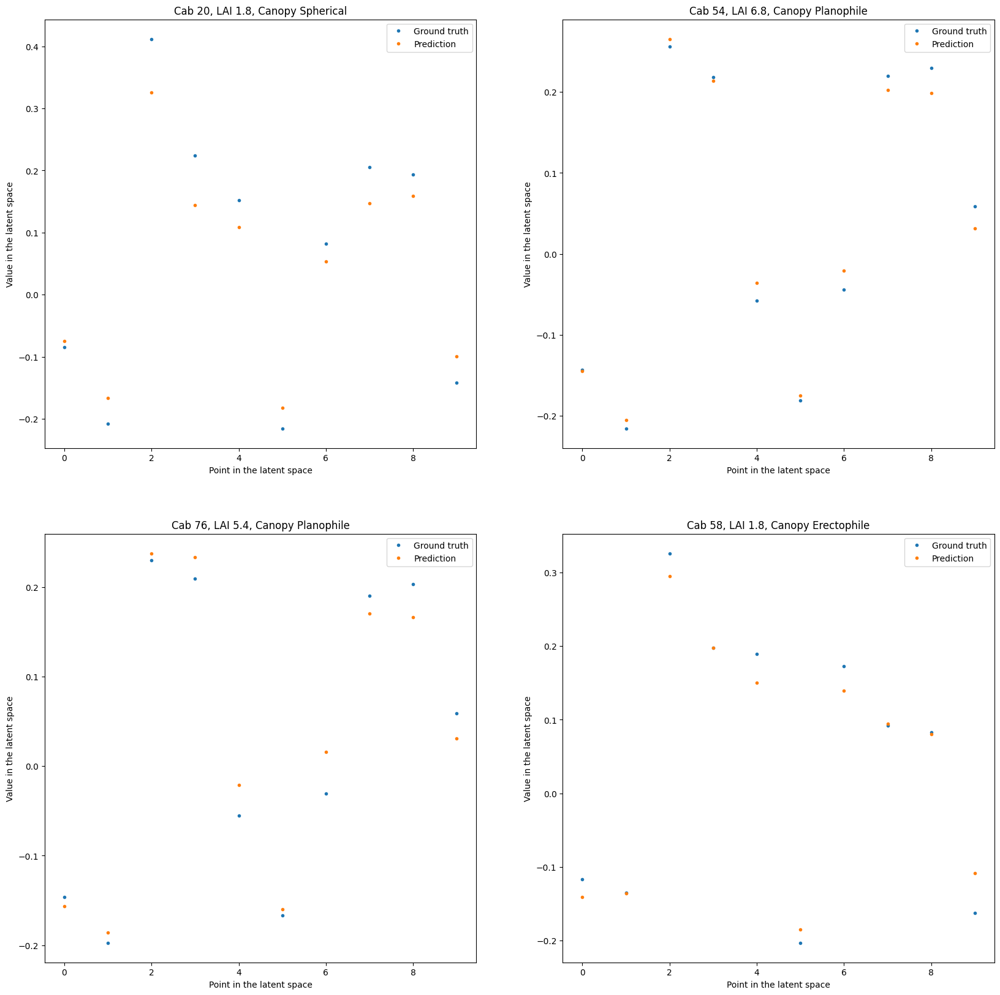

In [ ]:
indx = [-1, 3, 33, 67, 128, 85, 31, 53, 124, 286, 12, 186, 352, 226, 142]
i = 0
fig, axs = plt.subplots(2, 2, figsize = (20,20))

for ax in axs.flat:

  par = test_parameters.iloc[indx[i]]
  lat = df_lat_fc_test.iloc[indx[i]]
  predict_lat = fc_encoder(torch.tensor(par).to(torch.float32).unsqueeze(0))

  canopy = par[par == True].index[0]
  #replace the name of the canopy
  for pair in (('Canopy_1', 'Spherical'), ('Canopy_2', 'Erectophile'), ('Canopy_3', 'Planophile')):
    canopy = canopy.replace(*pair)

  ax.plot(lat, '.', label='Ground truth')
  ax.plot(predict_lat.detach().numpy()[0], '.', label = 'Prediction')
  ax.set_title('Cab ' + str(par[0]) +', LAI ' + str(par[1]) + ', Canopy ' + canopy)
  ax.legend()
  ax.set_xlabel('Point in the latent space')
  ax.set_ylabel('Value in the latent space')
  i += 1


### Trainig and testing for the Convolutional model

In [ ]:
# Defien Dataloader
data_encoder = EncoderDataModule(train_parameters, val_parameters, test_parameters, df_lat_conv_train, df_lat_conv_val, df_lat_conv_test, batch_size = 200)

# init the model
conv_encoder = LitEncoderLatent()
# train with both splits
trainer = pl.Trainer(
    max_epochs=300,
    default_root_dir = '/content/conv_encoder/',
    callbacks=[pl.callbacks.ModelCheckpoint(monitor='val_loss')]
)

trainer.fit(conv_encoder, datamodule = data_encoder)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 3.2 K 
---------------------------------------
3.2 K     Trainable params
0         Non-trainable params
3.2 K     Total params
0.013     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=300` reached.


In [ ]:
# Take the best last model
folder = glob.glob('/content/conv_encoder/lightning_logs/version*')
folder.sort()
best_conv_encoder = glob.glob(folder[-1]+'/checkpoints/*')

In [ ]:
# test the model
trainer.test(ckpt_path= best_conv_encoder[0], dataloaders=data_encoder)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/conv_encoder/lightning_logs/version_1/checkpoints/conv_encoder_epoch=254-step=2805.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/conv_encoder/lightning_logs/version_1/checkpoints/conv_encoder_epoch=254-step=2805.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   0.004432149231433868    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.004432149231433868}]

In [ ]:
# load checkpoint
conv_encoder = LitEncoderLatent.load_from_checkpoint(best_conv_encoder[0])

# choose your trained nn.Module
conv_encoder.eval()
device = torch.device("cuda:0")

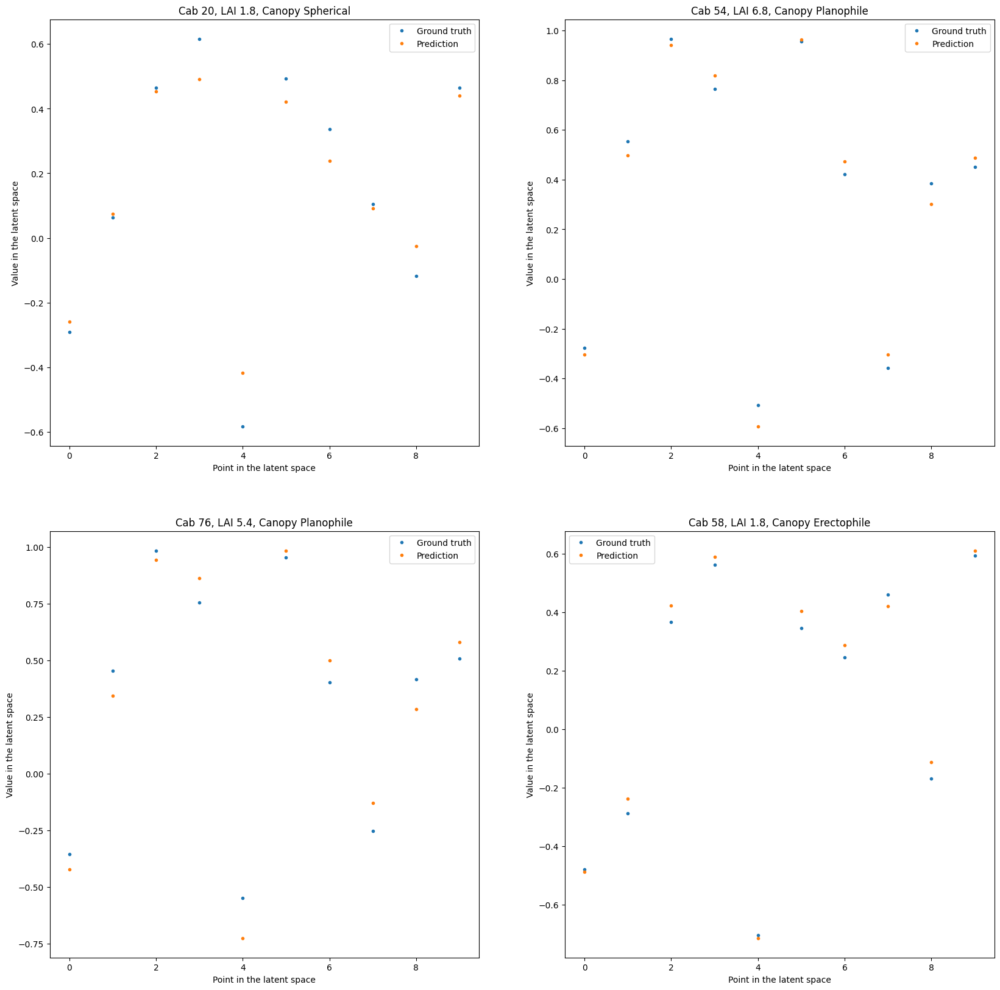

In [ ]:
indx = [-1, 3, 33, 67, 128, 85, 31, 53, 124, 286, 12, 186, 352, 226, 142]
i = 0
fig, axs = plt.subplots(2, 2, figsize = (20,20))

for ax in axs.flat:

  par = test_parameters.iloc[indx[i]]
  lat = df_lat_conv_test.iloc[indx[i]]
  predict_lat = conv_encoder(torch.tensor(par).to(torch.float32).unsqueeze(0))

  canopy = par[par == True].index[0]
  #replace the name of the canopy
  for pair in (('Canopy_1', 'Spherical'), ('Canopy_2', 'Erectophile'), ('Canopy_3', 'Planophile')):
    canopy = canopy.replace(*pair)

  ax.plot(lat, '.', label='Ground truth')
  ax.plot(predict_lat.detach().numpy()[0], '.', label = 'Prediction')
  ax.set_title('Cab ' + str(par[0]) +', LAI ' + str(par[1]) + ', Canopy ' + canopy)
  ax.legend()
  ax.set_xlabel('Point in the latent space')
  ax.set_ylabel('Value in the latent space')
  i += 1

## Testing the all model

### Prepare the test dataset and test routine

In [ ]:
# test dataset
class MyDataset(Dataset):

    def __init__(self, parameters, reflectance):
        # Dataframe in pandas
        self.parameters = parameters
        self.refelctance = reflectance


    def __len__(self):
        # here i will return the number of samples in the dataset
        return len(self.parameters)


    def __getitem__(self, idx):
        # take the inout and output in position idx
        cur_par = self.parameters.iloc[idx]
        cur_ref = self.refelctance.iloc[idx]
        # convert to torch format
        cur_par = torch.tensor(cur_par).to(torch.float32)
        cur_ref = torch.tensor(np.expand_dims(cur_ref, axis=0)).to(torch.float32)

        # return values
        return cur_par, cur_ref


In [ ]:
# define the dataloader
test_dataset = MyDataset(test_parameters, test_reflectance)

test_dl = torch.utils.data.DataLoader(test_dataset, batch_size=10)

In [ ]:
def compute_mse(net, dl, arc = 'fc'):
  #set the network in eval mode
  net.eval()

  mse = MeanSquaredError()
  # update metrics
  for par, ref in dl:
    #compute the prediction
    predict_ref = net(torch.tensor(par).to(torch.float32))
    if arc == 'fc':
      predict_ref = predict_ref.unsqueeze(1)
    if arc == 'conv':
      #print(predict_ref.shape)
      predict_ref = predict_ref[:,:,:350]
    mse.update(predict_ref.contiguous(), ref.to(torch.float32))

  # at the end, compute the final score
  return mse.compute()

### Fully Connected decoder

In [ ]:
# Create the dataframe of the parameters in the latent space
# load checkpoint of the encoder
fc_encoder = LitEncoderLatent.load_from_checkpoint(best_fc_encoder[0])
fc_decoder = FCAutoEncoder.load_from_checkpoint(best_fc_autoencoder[0]).decoder

fc_generator = nn.Sequential(fc_encoder, fc_decoder)
fc_generator.eval()

Sequential(
  (0): LitEncoderLatent(
    (encoder): Sequential(
      (0): Linear(in_features=5, out_features=200, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Dropout(p=0.6, inplace=False)
      (3): Linear(in_features=200, out_features=10, bias=True)
    )
  )
  (1): Sequential(
    (0): Linear(in_features=10, out_features=400, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Dropout(p=0.6, inplace=False)
    (3): Linear(in_features=400, out_features=350, bias=True)
  )
)

In [ ]:
test_mse = compute_mse(fc_generator, test_dl, 'fc')
print('The error test is ', test_mse.item())

<ipython-input-72-f750c2328ec0>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predict_ref = net(torch.tensor(par).to(torch.float32))


The error test is  0.0009693818865343928


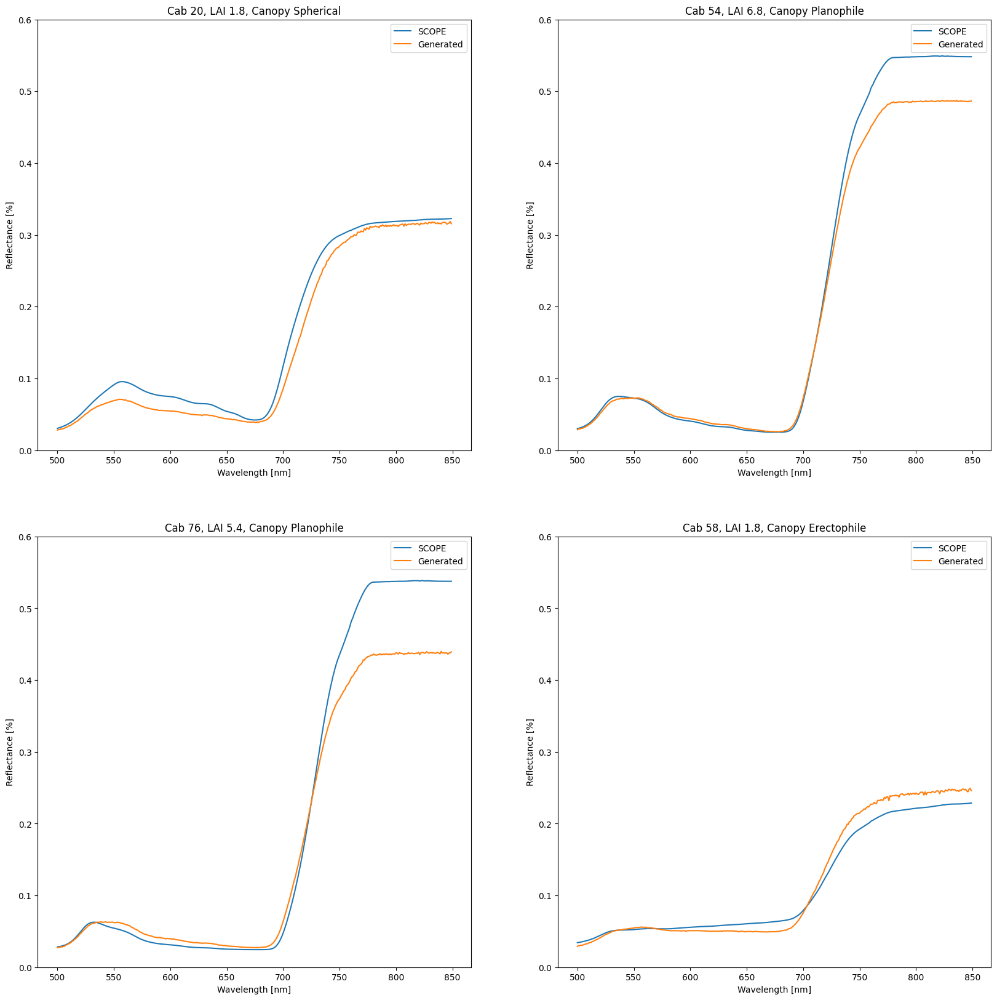

In [ ]:
indx = [-1, 3, 33, 67, 128, 85, 31, 53, 124, 286, 12, 186, 352, 226, 142]
i = 0
fig, axs = plt.subplots(2, 2, figsize=(20,20))
for ax in axs.flat:
  par = test_parameters.iloc[indx[i]]
  spectro = test_reflectance.iloc[indx[i]]
  predict_ref = fc_generator(torch.tensor(par).to(torch.float32).unsqueeze(0))[0]

  canopy = par[par == True].index[0]
  for pair in (('Canopy_1', 'Spherical'), ('Canopy_2', 'Erectophile'), ('Canopy_3', 'Planophile')):
    canopy = canopy.replace(*pair)

  ax.plot(wl, spectro, label='SCOPE')
  ax.plot(wl, predict_ref.detach().numpy(), label = 'Generated')
  ax.set_title('Cab ' + str(par[0]) +', LAI ' + str(par[1]) + ', Canopy ' + canopy)
  ax.legend()
  ax.set_xlabel('Wavelength [nm]')
  ax.set_ylabel('Reflectance [%]')
  i += 1


# Defining custom 'xlim' and 'ylim' values.
custom_ylim = (0, 0.6)
# Setting the values for all axes.
plt.setp(axs, ylim=custom_ylim);

### Convolutional decoder

In [ ]:
# Create the dataframe of the parameters in the latent space
# load checkpoint of the encoder
conv_encoder = LitEncoderLatent.load_from_checkpoint(best_conv_encoder[0])
conv_decoder = ConvAutoEncoder.load_from_checkpoint(best_conv_autoencoder[0]).decoder

conv_generator = nn.Sequential(conv_encoder, conv_decoder)
conv_generator.eval()

Sequential(
  (0): LitEncoderLatent(
    (encoder): Sequential(
      (0): Linear(in_features=5, out_features=200, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Dropout(p=0.6, inplace=False)
      (3): Linear(in_features=200, out_features=10, bias=True)
    )
  )
  (1): Sequential(
    (0): Linear(in_features=10, out_features=2816, bias=True)
    (1): ReLU(inplace=True)
    (2): Unflatten(dim=1, unflattened_size=(64, 44))
    (3): ConvTranspose1d(64, 32, kernel_size=(3,), stride=(2,), padding=(1,), output_padding=(1,))
    (4): ReLU(inplace=True)
    (5): ConvTranspose1d(32, 16, kernel_size=(3,), stride=(2,), padding=(1,), output_padding=(1,))
    (6): ReLU(inplace=True)
    (7): ConvTranspose1d(16, 1, kernel_size=(3,), stride=(2,), padding=(1,), output_padding=(1,))
    (8): Tanh()
  )
)

In [ ]:
test_mse = compute_mse(conv_generator, test_dl, 'conv')
print('The test error is ', test_mse.item())

<ipython-input-72-f750c2328ec0>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predict_ref = net(torch.tensor(par).to(torch.float32))


The test error is  0.0003627348633017391


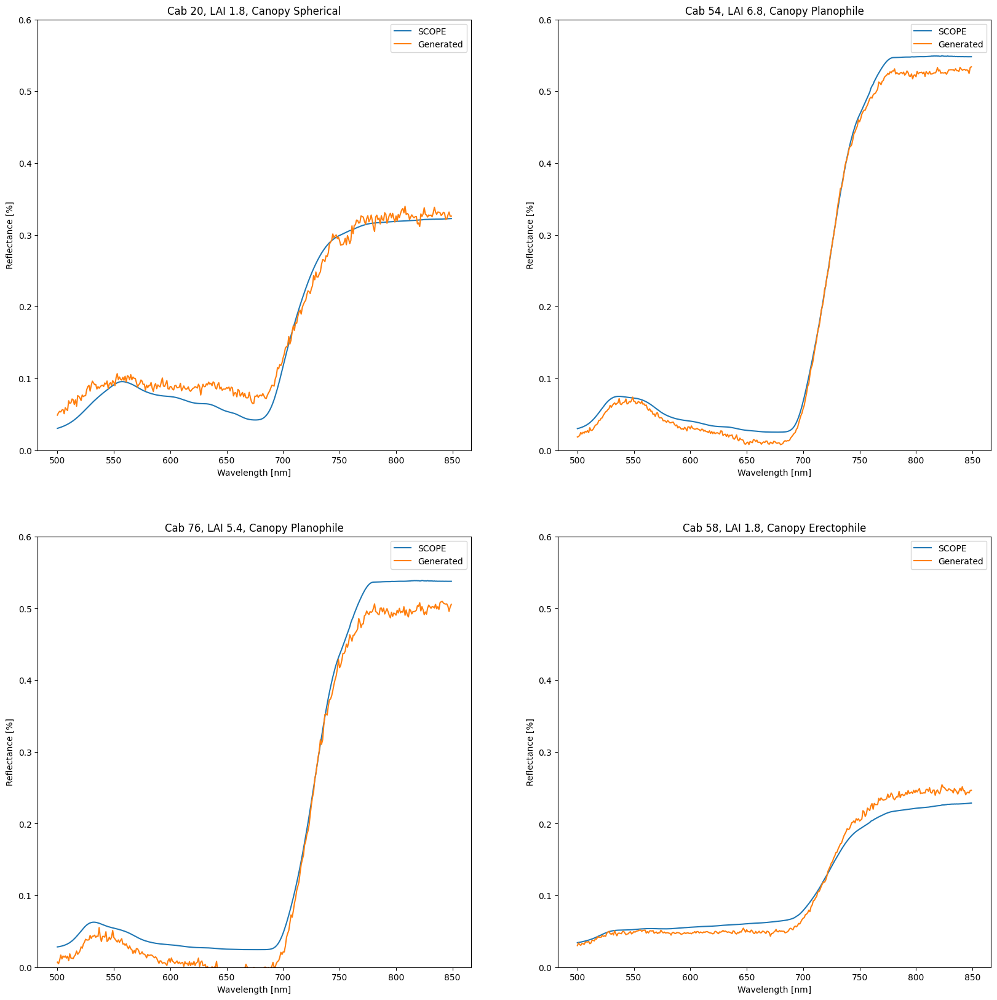

In [ ]:
indx = [-1, 3, 33, 67, 128, 85, 31, 53, 124, 286, 12, 186, 352, 226, 142]
i = 0
fig, axs = plt.subplots(2, 2, figsize=(20,20))
for ax in axs.flat:
  par = test_parameters.iloc[indx[i]]
  spectro = test_reflectance.iloc[indx[i]]
  predict_ref = conv_generator(torch.tensor(par).to(torch.float32).unsqueeze(0))[:,:,:350]

  canopy = par[par == True].index[0]
  for pair in (('Canopy_1', 'Spherical'), ('Canopy_2', 'Erectophile'), ('Canopy_3', 'Planophile')):
    canopy = canopy.replace(*pair)

  ax.plot(wl, spectro, label='SCOPE')
  ax.plot(wl, predict_ref.detach().numpy()[0,0], label = 'Generated')
  ax.set_title('Cab ' + str(par[0]) +', LAI ' + str(par[1]) + ', Canopy ' + canopy)
  ax.legend()
  ax.set_xlabel('Wavelength [nm]')
  ax.set_ylabel('Reflectance [%]')
  i += 1


# Defining custom 'xlim' and 'ylim' values.
custom_ylim = (0, 0.6)
# Setting the values for all axes.
plt.setp(axs, ylim=custom_ylim);

## Inspect the different classes

Performance based on canopy distribution

In [ ]:
# compute the mse for the difference canopy distribution
col_canopy = ['Net Architecture', 'Canopy_1', 'Canopy_2', 'Canopy_3']
mse_canopy = pd.DataFrame(columns = col_canopy)
mse_canopy.loc[0, 'Net Architecture'] = 'Fully connected'
mse_canopy.loc[1, 'Net Architecture'] = 'Convolutional'

for canopy in col_canopy[1:]:
  # define the dataset and dataloader
  ds = MyDataset(test_parameters[test_parameters[canopy]], test_reflectance[test_parameters[canopy]])
  dl = torch.utils.data.DataLoader(ds, batch_size=10)

  # compute mse
  mse_canopy.loc[0, canopy] = compute_mse(fc_generator, dl, 'fc').item()
  mse_canopy.loc[1, canopy] = compute_mse(conv_generator, dl, 'conv').item()

mse_canopy = mse_canopy.set_index(['Net Architecture'])
mse_canopy

<ipython-input-72-f750c2328ec0>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predict_ref = net(torch.tensor(par).to(torch.float32))


,Canopy_1,Canopy_2,Canopy_3
Net Architecture,,,
Fully connected,0.000212,0.000915,0.001939
Convolutional,0.000188,0.000476,0.00046


Performance based on Cab

In [ ]:
val_cab = [20,30,40,50,60,70,80]
col_cab = ['Net Architecture','20-30','30-40','40-50','50-60','60-70','70-80']
mse_cab = pd.DataFrame(columns = col_cab)

mse_cab.loc[0, 'Net Architecture'] = 'Fully connected'
mse_cab.loc[1, 'Net Architecture'] = 'Convolutional'

for i in range(1, len(val_cab)):
  ds = MyDataset(test_parameters[test_parameters['Cab'].between(val_cab[i-1], val_cab[i])], test_reflectance[test_parameters['Cab'].between(val_cab[i-1], val_cab[i])])
  dl = torch.utils.data.DataLoader(ds, batch_size=10)

  # compute mse
  mse_cab.loc[0, col_cab[i]] = compute_mse(fc_generator, dl, 'fc').item()
  mse_cab.loc[1, col_cab[i]] = compute_mse(conv_generator, dl, 'conv').item()

mse_cab = mse_cab.set_index(['Net Architecture'])
mse_cab

<ipython-input-72-f750c2328ec0>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predict_ref = net(torch.tensor(par).to(torch.float32))


,20-30,30-40,40-50,50-60,60-70,70-80
Net Architecture,,,,,,
Fully connected,0.000743,0.000771,0.000739,0.000947,0.001268,0.001489
Convolutional,0.000397,0.000354,0.000269,0.000264,0.000361,0.000546


Performance based on LAI

In [ ]:
val_lai = [1,2,3,4,5,6,7]
col_lai = ['Net Architecture','1-2','2-3','3-4','4-5','5-6','6-7']
mse_lai = pd.DataFrame(columns = col_lai)

mse_lai.loc[0, 'Net Architecture'] = 'Fully connected'
mse_lai.loc[1, 'Net Architecture'] = 'Convolutional'

for i in range(1, len(val_lai)):
  ds = MyDataset(test_parameters[test_parameters['LAI'].between(val_lai[i-1], val_lai[i])], test_reflectance[test_parameters['LAI'].between(val_lai[i-1], val_lai[i])])
  dl = torch.utils.data.DataLoader(ds, batch_size=10)

  # compute mse
  mse_lai.loc[0, col_lai[i]] = compute_mse(fc_generator, dl, 'fc').item()
  mse_lai.loc[1, col_lai[i]] = compute_mse(conv_generator, dl, 'conv').item()

mse_lai = mse_lai.set_index(['Net Architecture'])
mse_lai

<ipython-input-72-f750c2328ec0>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predict_ref = net(torch.tensor(par).to(torch.float32))


,1-2,2-3,3-4,4-5,5-6,6-7
Net Architecture,,,,,,
Fully connected,0.00058,0.000844,0.001273,0.001198,0.000964,0.001024
Convolutional,0.000214,0.000386,0.000523,0.000442,0.000327,0.000321


Performance of Erectophile canopy and LAI

In [ ]:
val_lai = [1,2,3,4,5,6,7]
col_lai = ['Net Architecture','1-2','2-3','3-4','4-5','5-6','6-7']
mse_lai = pd.DataFrame(columns = col_lai)

mse_lai.loc[0, 'Net Architecture'] = 'Fully connected'
mse_lai.loc[1, 'Net Architecture'] = 'Convolutional'

test_parameters_erc = test_parameters[test_parameters['Canopy_2']]
test_reflectance_erc = test_reflectance[test_parameters['Canopy_2']]
for i in range(1, len(val_lai)):
  ds = MyDataset(test_parameters_erc[test_parameters_erc['LAI'].between(val_lai[i-1], val_lai[i])], test_reflectance_erc[test_parameters_erc['LAI'].between(val_lai[i-1], val_lai[i])])
  dl = torch.utils.data.DataLoader(ds, batch_size=10)

  # compute mse
  mse_lai.loc[0, col_lai[i]] = compute_mse(fc_generator, dl, 'fc').item()
  mse_lai.loc[1, col_lai[i]] = compute_mse(conv_generator, dl, 'conv').item()

mse_lai = mse_lai.set_index(['Net Architecture'])
mse_lai

<ipython-input-72-f750c2328ec0>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predict_ref = net(torch.tensor(par).to(torch.float32))


,1-2,2-3,3-4,4-5,5-6,6-7
Net Architecture,,,,,,
Fully connected,0.000305,0.000449,0.000822,0.001035,0.001225,0.001522
Convolutional,0.000215,0.000418,0.000559,0.000592,0.000552,0.000549


Mean error at difference wavelength

In [ ]:
# Create the dataset of all predicted signal by the model
fc_prediction_test = []
conv_prediction_test = []

for _, par in test_parameters.iterrows():
  predict_spec_fc = fc_generator(torch.tensor(par).to(torch.float32))
  fc_prediction_test.append(predict_spec_fc.detach().numpy())

  predict_spec_conv = conv_generator(torch.tensor(par).to(torch.float32).unsqueeze(0))
  conv_prediction_test.append(predict_spec_conv.detach().numpy())

df_fc_pred_test = pd.DataFrame(np.squeeze(fc_prediction_test)).T
df_conv_pred_test = pd.DataFrame(np.squeeze(conv_prediction_test)).T
df_ref_test = test_reflectance.T

In [ ]:
fc_wavelength_error = []
conv_wavelength_error = []

for i in range(df_ref_test.shape[0]):
  fc_wavelength_error.append(mean_squared_error(df_fc_pred_test.iloc[i], df_ref_test.iloc[i]))
  conv_wavelength_error.append(mean_squared_error(df_conv_pred_test.iloc[i], df_ref_test.iloc[i]))

fc_wavelength_error = np.array(fc_wavelength_error)
conv_wavelength_error = np.array(conv_wavelength_error)

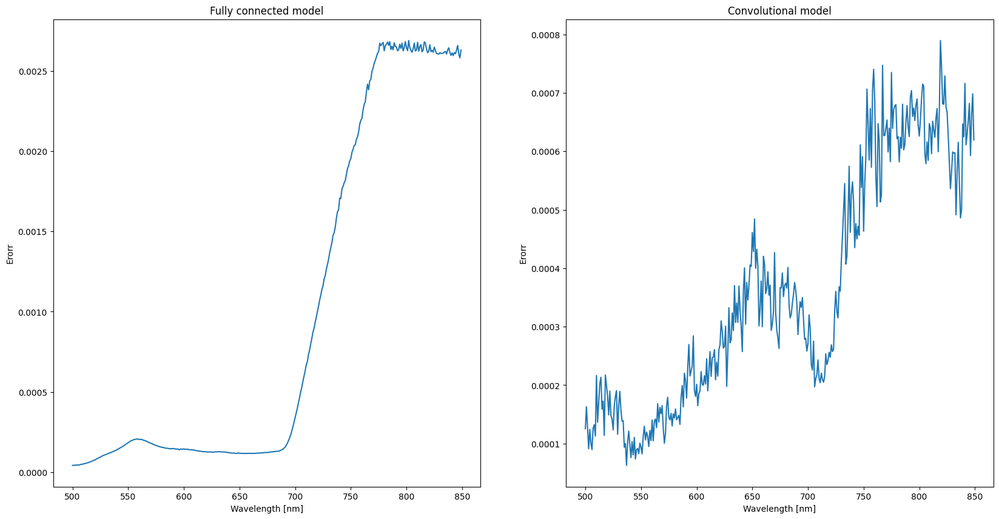

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(20,10))

axs[0].plot(wl, fc_wavelength_error)
axs[0].set_xlabel('Wavelength [nm]')
axs[0].set_ylabel('Erorr')
axs[0].set_title('Fully connected model')

axs[1].plot(wl, conv_wavelength_error)
axs[1].set_xlabel('Wavelength [nm]')
axs[1].set_ylabel('Erorr')
axs[1].set_title('Convolutional model');